# Проектная работа
**Рынок заведений общественного питания Москвы  
Описание проекта**  
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание данных** 
Файл moscow_places.csv:  

* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;  
«Цена чашки капучино: 130–220 ₽»;  
«Цена бокала пива: 400–600 ₽».  
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.
**Задачи проекта**
Провести исследование рынка заведений общественного питания Москвы и найти интересные особенности  
Подготовить презентацию с полученными результатами, которые в будущем помогут в выборе подходящего инвесторам места  

### Загрузка данных и общая информация

In [1]:
#Подгружаем все необходимые библиотеки.
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from folium import Marker, Map, Choropleth
import plotly.express as px
import json
from folium.plugins import MarkerCluster
from plotly import graph_objects as go

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
#рассмотрим основную информацию
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
#выведем 5 первых строк
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Промежуточный итог:**  
В данных 8406 строк, т.е. столько же и объектов.  
Имееться большое количество пропусков в справочной информации объектов. Что либо делать с ними пока не будем.    
Все данные имеют формат float64 и object, кроме столбцы chain у которого формат int64.

### Предобработка данных
#### Проверка на наличие дубликатов

In [4]:
#Посмотрим есть ли явные дубликаты
data.duplicated().sum()

0

In [5]:
#посмотрим есть ли дубликаты по с одинаковым именем и адресом, но перед этим приведем их к нижнему регистру.
data['address'] = data['address'].str.lower()
data[['name', 'address']].duplicated().sum()

1

In [6]:
#удаляем наши дубликаты и проверяем
data = data.drop_duplicates(subset=['name','address'])
data[['name', 'address']].duplicated().sum()

0

In [7]:
#рассмотрим категории предприятий указанных в данных
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
#рассмотрим районы города
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [9]:
#посмотрим сколько наименований предприятий в данных
data.name.nunique()

5614

In [10]:
#сколько из них относиться к сетям
data.query('chain == 1')['name'].nunique()

762

In [11]:
#сколько предприятий не относится к сетям
data.query('chain == 0')['name'].nunique()

4852

#### Пропуски

In [12]:
#посчитаем пропуски
data.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7870
middle_avg_bill      5256
price                5090
avg_bill             4589
seats                3610
hours                 536
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [13]:
#посмотрим сколько строк не заполнено у сетей
data.query('chain == 1').isna().sum().sort_values(ascending=False)

middle_coffee_cup    2942
price                2068
middle_avg_bill      2019
avg_bill             1740
seats                1278
hours                 116
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [14]:
#посмотрим сколько строк не заполнено у не сетей
data.query('chain == 0').isna().sum().sort_values(ascending=False)

middle_coffee_cup    4928
middle_avg_bill      3237
price                3022
avg_bill             2849
seats                2332
hours                 420
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

Попробуем заполнить часть данных в столбце price, хотя бы у сетей, т.к. у них фиксированная одинаковая цена на продукцию. 

In [15]:
#создаем словарь и функцию для заполнения price
data_chain = data.dropna(subset=['price'])[['name', 'price']].set_index('name')['price'].to_dict()
def chain_price(i):
    if i['price'] == i['price']:
        return i['price']
    else:
        if i['name'] in data_chain:
            return data_chain[i['name']]
        else:
            return i['price']

In [16]:
#применяем функцию
data['price'] = data.apply(lambda i: chain_price(i), axis=1)

In [17]:
#проверяем результаты
data.query('chain == 1').isna().sum().sort_values(ascending=False)

middle_coffee_cup    2942
middle_avg_bill      2019
avg_bill             1740
seats                1278
price                 971
hours                 116
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [18]:
#посмотрим на общую картину
data.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7870
middle_avg_bill      5256
avg_bill             4589
price                3708
seats                3610
hours                 536
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

#### Создание новых столбцов

In [19]:
#создадим новый столбец с названием улицы
data['street'] = data['address'].apply(lambda x: x.split(', ')[1])

In [20]:
#создаем столбец круглосуточных и ежедневных предприятий
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

In [21]:
#посмотрим что получилось на 10 случайных строках
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4478,Untitled,кафе,"москва, яузский бульвар, 14/8",Центральный административный округ,NaN,55.750969,37.643473,4.5,средние,Средний счёт:1500–2000 ₽,1750.0,NaN,0,16.0,яузский бульвар,False
7471,Gimme Coffee,кафе,"москва, люблинская улица, 100, корп. 2",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.654911,37.739986,4.0,NaN,NaN,NaN,NaN,0,60.0,люблинская улица,False
8222,Pizzahhh! Big City Pizza!,пиццерия,"москва, дубининская улица, 69",Южный административный округ,"пн,вт 12:00–22:30; чт 14:30–00:30; пт,сб 16:30...",55.715925,37.634668,4.1,средние,Средний счёт:700–1500 ₽,1100.0,NaN,0,8.0,дубининская улица,False
6544,Senza Nome,пиццерия,"москва, улица островитянова, 9, корп. 5",Юго-Западный административный округ,"ежедневно, 11:00–22:30",55.645100,37.497016,4.7,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,240.0,улица островитянова,False
2879,Баку,кафе,"москва, монтажная улица, 9, стр. 1",Восточный административный округ,"ежедневно, круглосуточно",55.814241,37.772411,4.9,NaN,NaN,NaN,NaN,1,75.0,монтажная улица,True
1880,Чайхона Айва,кафе,"москва, ленинградский проспект, 45, корп. 1",Северный административный округ,"ежедневно, круглосуточно",55.798882,37.533990,4.3,выше среднего,NaN,NaN,NaN,1,625.0,ленинградский проспект,True
194,Ленкорань,кафе,"москва, дмитровское шоссе, 165, корп. 1",Северо-Восточный административный округ,"ежедневно, 06:00–20:00",55.914574,37.539103,1.4,NaN,NaN,NaN,NaN,0,350.0,дмитровское шоссе,False
1731,Fly Coffee,кофейня,"москва, бутырская улица, 46, стр. 1",Северо-Восточный административный округ,пн-пт 08:00–20:00,55.799448,37.584747,4.3,NaN,NaN,NaN,NaN,0,98.0,бутырская улица,False
5511,Lucky Bakery,булочная,"москва, 2-й вольный переулок, 11",Восточный административный округ,"ежедневно, 09:00–21:00",55.774377,37.738953,4.3,NaN,NaN,NaN,NaN,0,NaN,2-й вольный переулок,False
2093,Марокко,ресторан,"москва, лесная улица, 20, стр. 3",Центральный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–02:00; вс 10:00...",55.780347,37.592500,4.0,средние,Средний счёт:500–800 ₽,650.0,NaN,0,500.0,лесная улица,False


#### Итог предобработки

* Обнаружен 1 дубликат, который мы удалили. Приводить наименования к нижнему регистру не стали т.к. иногда некоторые магазины называються одинаково, и только РеГиСтР их отличает.
* Так же посчитали 5614 уникальных наименований предприятий. 762 предприятия относятся к сетям т.е. имеют несколько "точек", 4852 не относятся к сетям.
* Мы увидели большое количество пропусков в справочной информации о заведениях т.к. его заполняют или сами заведения и/или пользователи. Пропуски в  столбце price у сетевых предприятий мы заполнили аналогичными данными с других "точек" т.к. у сетей одинаковая цена продукции и сегмент рынка. В итоге нам удалось сократить количество пропусков с 5090 до 3708. Остальные пропуски трогать не будем, т.к. это может исказить результаты исследования.  
* Добавили 2 новых столбца с информацией о улице на которой стоит предприятие и столбец с указанием работает ли заведение ежедневного и круглосуточно или нет. 

###  Анализ данных
#### Категории заведений представленные в данных.

In [22]:
data_categories = (data.pivot_table(index='category', values='name', aggfunc='count')
                   .sort_values(by='name', ascending=False)
                   .reset_index()
                   .rename(columns={'name':'count'}))

total_count = data_categories['count'].sum()
data_categories['percent'] = data_categories.apply(lambda row: '{:.1%}'.format(row['count'] / total_count), axis=1)

In [23]:
data_categories

,category,count,percent
0,кафе,2377,28.3%
1,ресторан,2043,24.3%
2,кофейня,1413,16.8%
3,"бар,паб",765,9.1%
4,пиццерия,633,7.5%
5,быстрое питание,603,7.2%
6,столовая,315,3.7%
7,булочная,256,3.0%


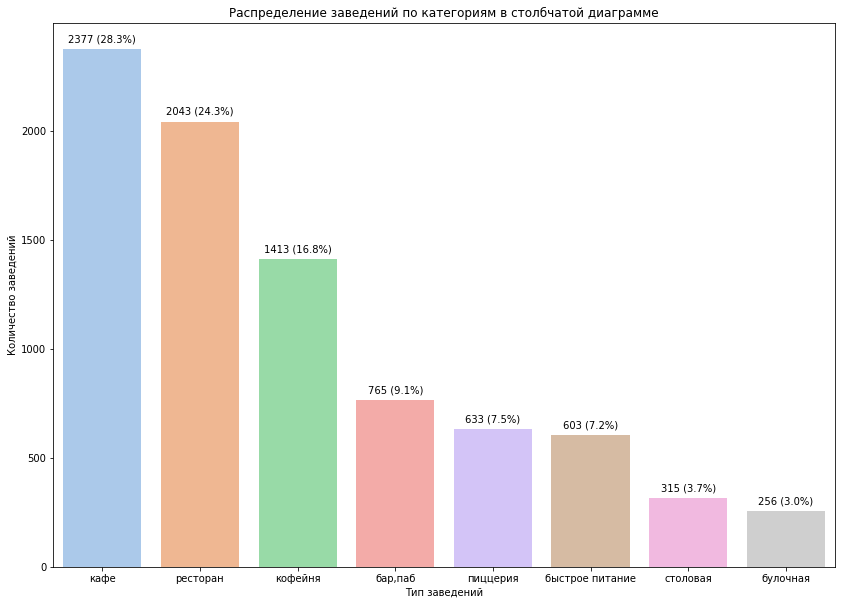

In [24]:
# создаем график
plt.figure(figsize=(14, 10))
sns.set_palette('pastel')
ax = sns.barplot(data=data_categories, x='category', y='count')
ax.set(title='Распределение заведений по категориям в столбчатой диаграмме', xlabel='Тип заведений', ylabel='Количество заведений')

# добавим числовые выражения к столбцам
for p, perc in zip(ax.patches, data_categories['percent']):
    ax.annotate(f"{format(p.get_height(), '.0f')} ({perc})", 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 10), 
                textcoords = 'offset points')

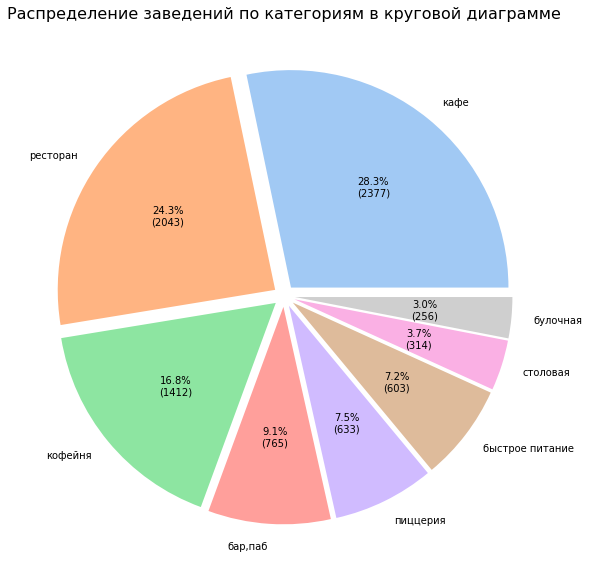

In [25]:
fig, ax = plt.subplots(figsize=(14, 10))
explode = [0.05] * len(data_categories) # установка расстояния между кусочками
ax.pie(data_categories['count'], labels=data_categories['category'], 
       autopct=lambda pct: f"{pct:.1f}%\n({int(pct/100.*sum(data_categories['count']))})", 
       textprops={'fontsize': 10}, explode=explode)

# Добавление заголовка
ax.set_title('Распределение заведений по категориям в круговой диаграмме', fontsize=16)

# Отображение графика
plt.show()

**Промежуточный итог:**  
Наибольшее количество заведений размещены в категориях Кафе -28.3%(2377), Рестораны - 24.3%(2043), Кофейни - 16.8%(1412), остальные категории набирают не более 10% от всей массы данных. 

#### Количество посадочных мест в местах по категориям.
Рассмотрим медианные значения, а для этого как график подойдет ящик с усами.

In [26]:
data_seats = (data.pivot_table(index='category', values='seats', aggfunc=['median', 'mean'])
             .sort_values(by=('median','seats'), ascending=False)
             .reset_index())
data_seats

,category,median,mean
,,seats,seats
0,ресторан,86.0,121.944094
1,"бар,паб",82.5,124.532051
2,кофейня,80.0,111.199734
3,столовая,75.5,99.750000
4,быстрое питание,65.0,98.891117
5,кафе,60.0,97.512315
6,пиццерия,55.0,94.496487
7,булочная,50.0,89.385135


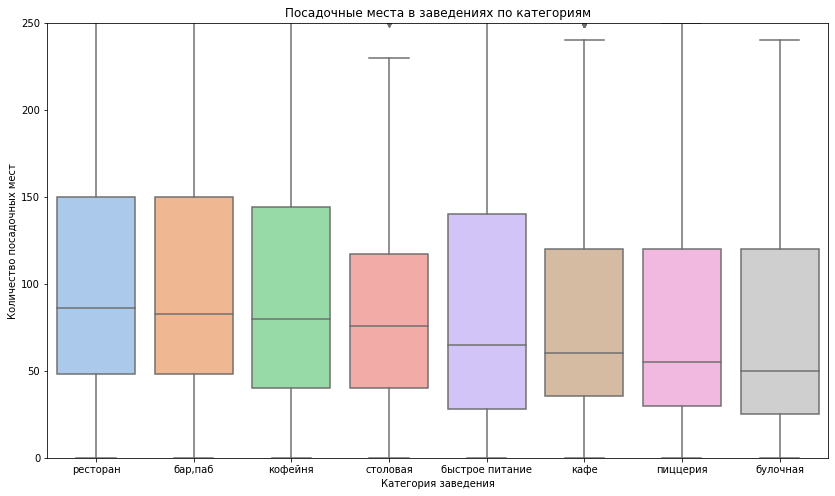

In [27]:
#Строим ящик с усами чтобы увидеть количество посадочных мест.
plt.figure(figsize=(14,8))
sns.boxplot(data=data.dropna(subset=['seats']), x='category', y='seats', order=data.groupby('category')['seats'].median().sort_values(ascending=False).index) 
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.title('Посадочные места в заведениях по категориям')
plt.ylim([0,250])
plt.show()

**Промежуточный итог:**  
Для всех категорий заведений медианное количество посадочных мест варьируется с 50 до 86. Визуализация так же подтверждает что для большинства заведений разница не столь огромна. 
Самый низкий разброс в посадочных местах виден у столовых, а самый высокий у заведений быстрого питания. 

#### Соотношение сетевых и несетевых заведений

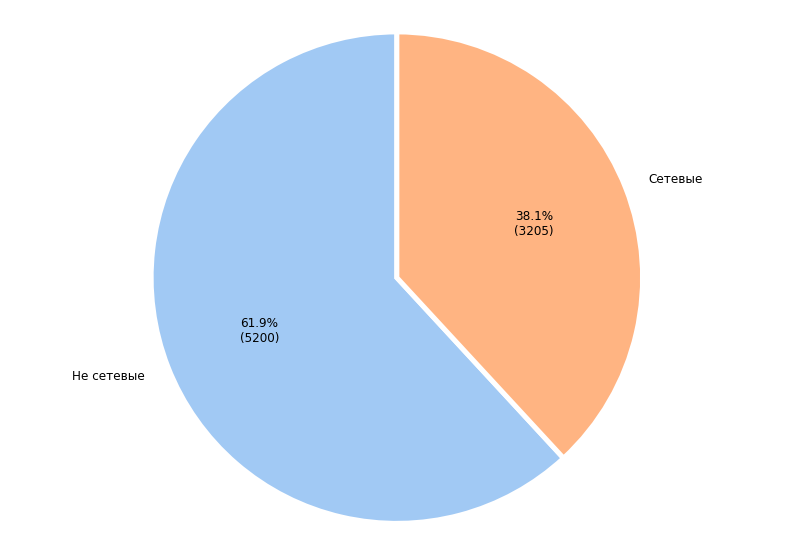

In [28]:
# Считаем количество сетевых и несетевых заведений
chain_counts = data['chain'].value_counts()
total = sum(chain_counts)
# Создаем круговую диаграмму
plt.figure(figsize=(14, 10))
wedges, labels, autopct = plt.pie(chain_counts, 
                                   labels=['Не сетевые', 'Сетевые'], 
                                   autopct=lambda pct: '{:.1f}%\n({:d})'.format(pct, int(round(pct/100*total))),
                                   startangle=90, 
                                   wedgeprops={'edgecolor': 'white', 'linewidth': 5},
                                   textprops={'fontsize': 12, 'color': 'black'})
plt.axis('equal')

# Отображаем график
plt.show()

**Промежуточный итог:**  
Сетевых заведений меньше 38.1%(3205), чем не сетевых 61.9%(5200)

#### Категории  сетевых заведений

In [29]:
#построим сводную таблицу
categories_network = data.replace([1,0], ['сетевое','не сетевое']).pivot_table(index = 'category', values = 'name', columns = 'chain',
aggfunc = 'count').sort_values(by= 'сетевое', ascending=False)

In [30]:
#смотрим что у нас получилось
categories_network

chain,не сетевое,сетевое
category,,
кафе,1598,779
ресторан,1313,730
кофейня,693,720
пиццерия,303,330
быстрое питание,371,232
"бар,паб",596,169
булочная,99,157
столовая,227,88


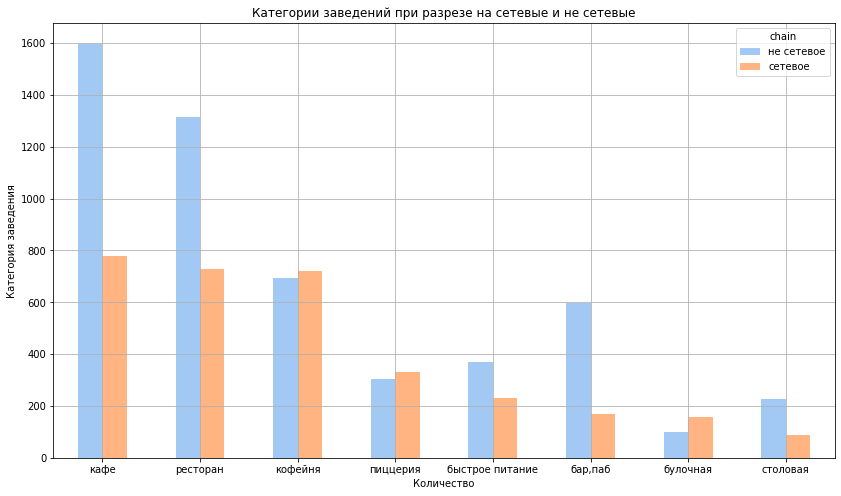

In [31]:
#построим график
categories_network.plot(kind='bar',title='Категории заведений при разрезе на сетевые и не сетевые', figsize=(14,8))
plt.xticks(rotation=0)
plt.xlabel('Количество')
plt.ylabel('Категория заведения')
plt.grid(True)


**Промежуточный итог:**  
По графику и сводной таблице мы видим что сетевые заведения чаще всего бывают кафе, ресторанами и кофейнями.   
При это только кофеен,пиццерий и булочных бывает больше сетевых, чем не сетевых. В остальных категориях несетевых заведений больше. 

#### Топ-15 сетей в Москве. 


In [32]:
#построим табличку
moscow_top_15 = (data.query('chain == 1')
    .groupby(['name', 'category'])[['name']]
    .count()
    .rename(columns={'name':'count'})
    .sort_values(by='count', ascending=False)
    .reset_index()
    .head(15))

In [33]:
#проверяем
moscow_top_15

,name,category,count
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


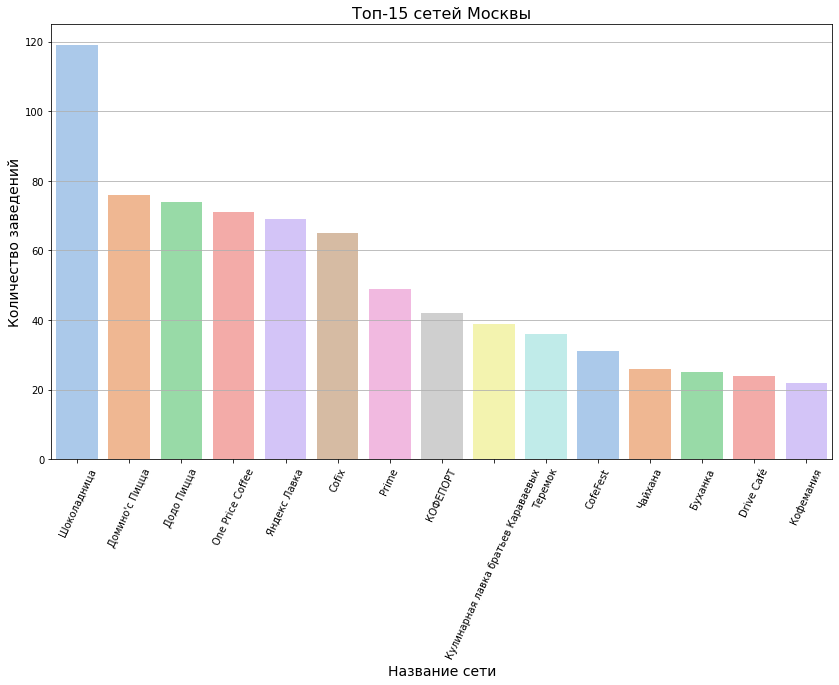

In [34]:
plt.figure(figsize=(14, 8)) 

fig = sns.barplot(x='name', y='count', data=moscow_top_15, palette='pastel')

plt.xlabel('Название сети', fontsize=14)
plt.ylabel('Количество заведений', fontsize=14)
plt.title('Топ-15 сетей Москвы', fontsize=16)

fig.set_xticklabels(fig.get_xticklabels(),rotation = 65)
plt.grid(True, axis='y')

plt.show(fig)

**Промежуточный итог:**  
Самой популярной(распространенной) сетью заведения является кофейня Шоколадница(119), а второе и третье место достаются пиццериями Домино'с(76) и Додо(74). Все сети из топ-15 достаточно известны и/или о них хотя бы слышали. При этом в топ-15 вошли аж 6 кофеен, и при этом имеется только 3 ресторана и 3 кафе.

#### Заведения по административным районам Москвы.

In [35]:
#посмотрим на районы города
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [36]:
#создаем табличку
category_counts = pd.pivot_table(data, values='name', index='district', columns='category', aggfunc='count', fill_value=0)
category_counts['total'] = category_counts.sum(axis=1)
category_counts = category_counts.sort_values(by='total', ascending=False)
category_counts.index = category_counts.index.str.replace('административный ', '') #решил удалить слово "административный", для легкости чтения и построения графика
category_counts

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный округ,364,50,87,464,428,113,670,66,2242
Северный округ,68,39,58,234,193,77,189,41,899
Южный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный округ,63,28,82,269,159,68,182,40,891
Западный округ,50,37,62,239,150,71,218,24,851
Восточный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный округ,38,13,67,282,89,55,145,25,714
Юго-Западный округ,38,27,61,238,96,64,168,17,709
Северо-Западный округ,23,12,30,115,62,40,109,18,409


Text(0, 0.5, 'Количество заведений')

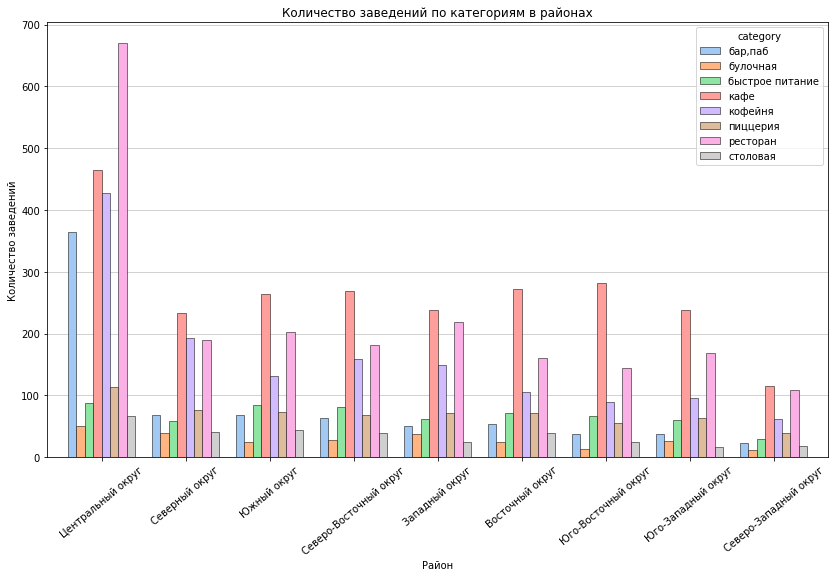

In [37]:
#Строим столбчатую диаграмму
ax = category_counts.plot.bar(figsize=(14, 8), use_index=True, y=category_counts.columns.difference(['total']), width=0.8, edgecolor='black', linewidth=0.5)
ax.set_axisbelow(True)  
ax.grid(axis='y', alpha=0.7) 
ax.set_xticklabels(ax.get_xticklabels(),rotation = 40) 
plt.title('Количество заведений по категориям в районах')
plt.xlabel('Район')
plt.ylabel('Количество заведений')


**Промежуточный итог:**  
По таблице и графицу мы видим что значительная часть заведений расположена в центральном округе, и особенно много в центральном округе ресторанов(670). Так же центральный округ значительно опережает другие районы по количеству баров/пабов(364), кафе(464) и кофеен(428). Остальные районы города более менее равны друг с другом, кроме как Северо-Западного, в котором меньше всего заведений. 

#### Распределение средних рейтингов по категориям заведений

In [38]:
# Создаем сводную таблицу и изменяем названия столбцов
moscow_rating = pd.pivot_table(data, values='rating', index='category', aggfunc='mean')
moscow_rating = moscow_rating.sort_values(by='rating', ascending=False)
moscow_rating

,rating
category,
"бар,паб",4.387712
пиццерия,4.301264
ресторан,4.290357
кофейня,4.277282
булочная,4.268359
столовая,4.211429
кафе,4.124274
быстрое питание,4.050249


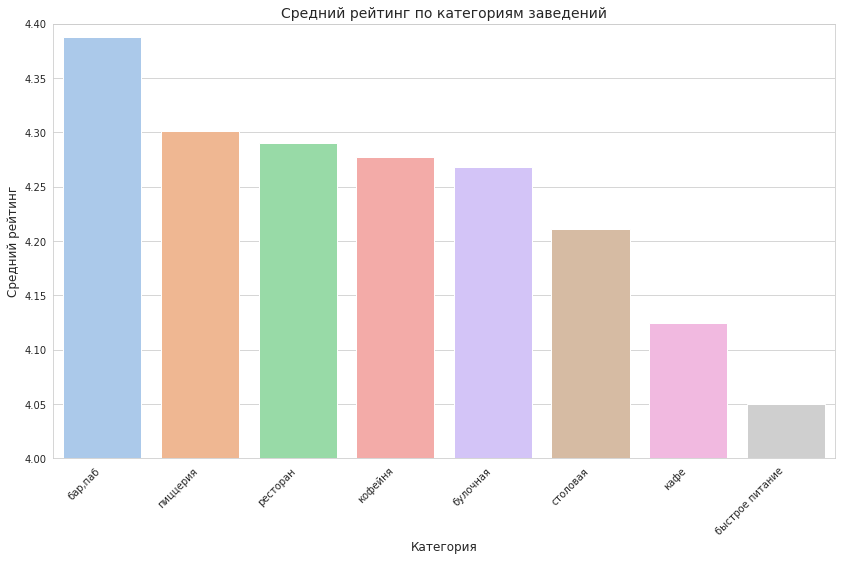

In [39]:
# Создаем график
sns.set_style('whitegrid')
sns.set_palette('pastel')
fig, ax = plt.subplots(figsize=(14, 8))
ax = sns.barplot(x=moscow_rating.index, y='rating', data=moscow_rating, palette='pastel', ci=None)
ax.set_xlabel('Категория', fontsize=12)
ax.set_ylabel('Средний рейтинг', fontsize=12)
ax.set_title('Средний рейтинг по категориям заведений', fontsize=14)
ax.set_ylim(4, 4.4)
plt.xticks(rotation=45, ha='right')
plt.show()

**Промежуточный итог:**  
Средний рейтинг по категориям заведений варьируется от 4.05 до 4.38. Наибольшим средним рейтингом обладают Бары/Пабы, а наименшим заведения быстрого питания.

#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района


In [40]:
#создаем табличку со средним рейтингом по районам города
disctict_rating = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending = False)
disctict_rating

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.240934
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [41]:
#не смог поставить просто наименование карты, пришлось ссылку
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
#отмечаем центр города
moscow_lat, moscow_lng = 55.751244, 37.618423
#вставляем карту
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# делаем хороплет
Choropleth(
    geo_data=state_geo,
    data=disctict_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Усредненный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Промежуточный итог:**  
Наилучший средний рейтинг в Центральном округе(4.38), наименьшие же цифры показывает Юго-Восточный округ(4.1).

#### Все заведения датасета на карте

In [42]:
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, no_touch=True)
marker_cluster = MarkerCluster().add_to(m1)
moscow_lat, moscow_lng = 55.751244, 37.618423
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']}"
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
data.apply(create_marker, axis=1)

m1

**Промежуточный итог:**  
Если приблизить и подвигать карту, становиться видно, что имеются некоторые концетрации заведений в определенных участках карты. Т.е. заведения распределены не равномерно, а скорее в "проходимых" местах. 

#### Топ-15 улиц по количеству заведений

In [43]:
# Создание таблицы
top_15_streets = data.pivot_table(index='street', columns='category', values='name', aggfunc='count', fill_value=0)
top_15_streets['total'] = top_15_streets.sum(axis=1)
top_15_streets = top_15_streets.sort_values('total', ascending=False).head(15)
top_15_streets

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект мира,12,4,21,53,36,11,45,2,184
профсоюзная улица,6,4,15,35,18,15,26,3,122
проспект вернадского,7,1,12,25,16,12,33,2,108
ленинский проспект,10,3,2,26,23,5,33,5,107
ленинградский проспект,15,4,2,12,25,9,25,3,95
дмитровское шоссе,6,2,10,23,11,8,24,4,88
каширское шоссе,2,0,10,20,16,5,19,5,77
варшавское шоссе,6,0,7,18,14,4,20,7,76
ленинградское шоссе,5,2,5,13,13,3,26,3,70


Text(0, 0.5, 'Количество заведений')

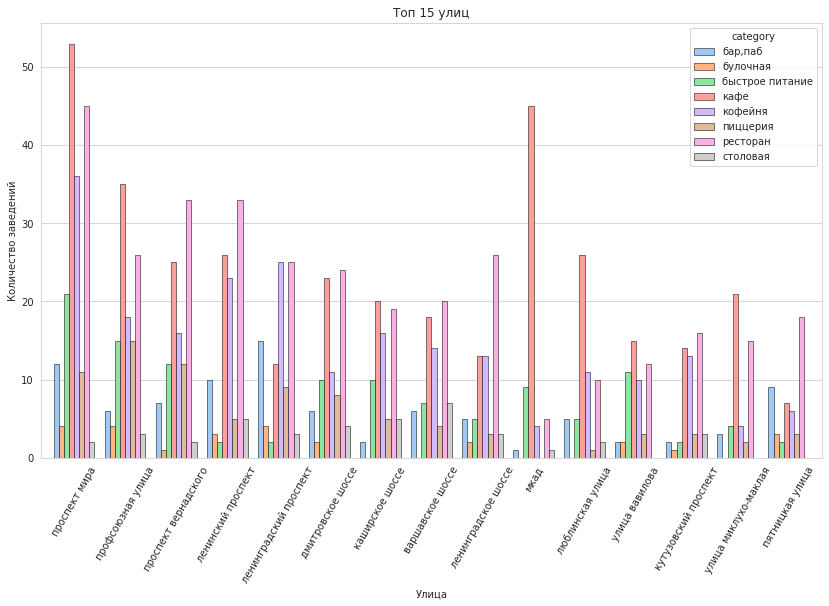

In [44]:
#Строим столбчатую диаграмму
ax = top_15_streets.plot.bar(figsize=(14, 8), use_index=True, y=top_15_streets.columns.difference(['total']), width=0.8, edgecolor='black', linewidth=0.5)
ax.set_axisbelow(True)  
ax.grid(axis='x', alpha=0.7) 
ax.set_xticklabels(ax.get_xticklabels(),rotation = 60) 
plt.title('Топ 15 улиц')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')

**Промежуточный итог:**  
По таблице и графику видно что Проспект мира(184) сконцентрировал в себе наибольшее количество заведений. Интересным также выглядит МКАД(65), находясь на 10 месте по общему количеству заведений, он находится на втором по количеству кафе(45). 

#### Улицы, на которых находится только один объект общепита


In [45]:
# создаем таблицу
quiet_street = data.groupby('street')['name'].count()
quiet_street = quiet_street[quiet_street == 1]
single_street = data[data['street'].isin(quiet_street.index)]
single_street = single_street.groupby(['street', 'district', 'category']).size().reset_index(name='count')
single_street


,street,district,category,count
0,1-й автозаводский проезд,Южный административный округ,кафе,1
1,1-й балтийский переулок,Северный административный округ,ресторан,1
2,1-й варшавский проезд,Южный административный округ,кафе,1
3,1-й вешняковский проезд,Юго-Восточный административный округ,кафе,1
4,1-й голутвинский переулок,Центральный административный округ,"бар,паб",1
...,...,...,...,...
452,электрический переулок,Центральный административный округ,столовая,1
453,юго-западный административный округ,Юго-Западный административный округ,кафе,1
454,якиманский переулок,Центральный административный округ,кафе,1
455,яковоапостольский переулок,Центральный административный округ,кофейня,1


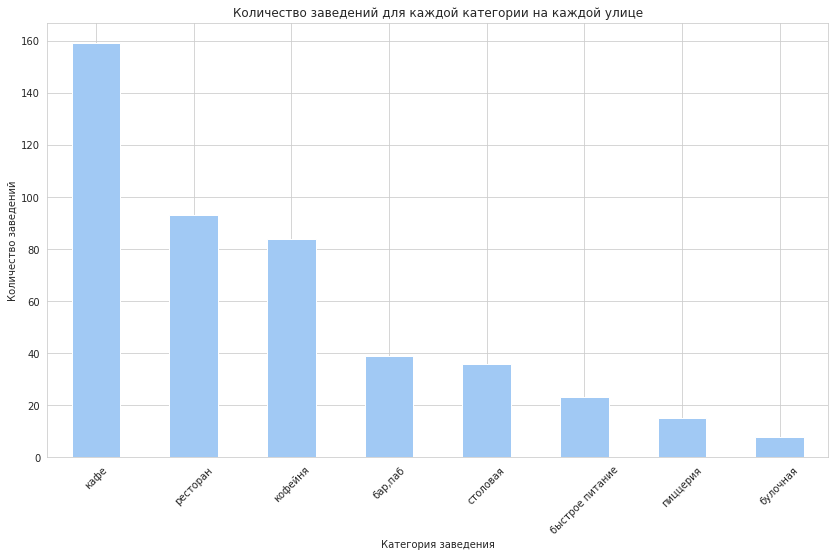

In [46]:
# строим график
fig, ax = plt.subplots(figsize=(14, 8))
single_street.groupby(['category']).sum()['count'].sort_values(ascending=False).plot(kind='bar', ax=ax)
plt.title('Количество заведений для каждой категории на каждой улице')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.show()

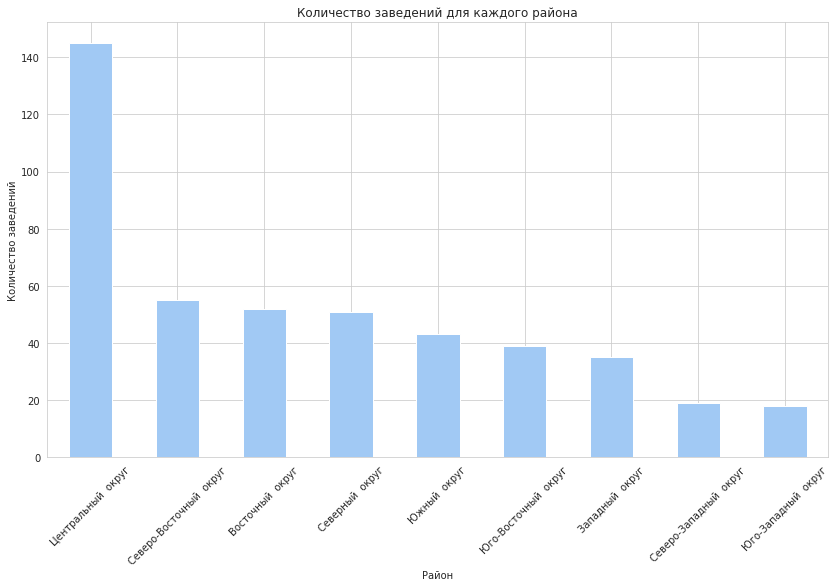

In [47]:
# сокращаем название районов и убираем слово "административный"
single_street['district'] = single_street['district'].apply(lambda x: x.replace('административный', '').strip())

# строим график
fig, ax = plt.subplots(figsize=(14, 8))
single_street.groupby(['district']).sum()['count'].sort_values(ascending=False).plot(kind='bar', ax=ax)
plt.title('Количество заведений для каждого района')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45) 
plt.show()

**Промежуточный итог:**  
По графикам выше видно что наибольшее количество улиц с 1 заведением находится в центральном округе, и чаще всего это кафе. По самим улицам можно сказать что в большинстве своем это маленькие короткие улицы. 

#### Cредние чеки заведений.

In [48]:
# посчитаем медиану столбца middle_avg_bill для каждого района
median_bill = (data.dropna(subset=['middle_avg_bill']).pivot_table(
        index='district',
        values='middle_avg_bill',
        aggfunc='median' 
    ).reset_index()
    .sort_values(by='middle_avg_bill', ascending=False)
    .rename(columns={'middle_avg_bill':'median_bill'})
)
median_bill

,district,median_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [49]:
# создаем хороплет со медианным значением среднего чека каждого района
msc_lat, msc_lng = 55.751244, 37.618423 # координаты центра Москвы
m_median_bill = Map(location=[msc_lat, msc_lng], zoom_start=10) # строим карту Москвы
Choropleth(
    geo_data = state_geo,
    data=median_bill,
    columns=['district','median_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Ценовой индикатор района'
).add_to(m_median_bill)
m_median_bill

In [50]:
import folium
from folium.plugins.heat_map import HeatMap
m = folium.Map([55.751244, 37.618423], zoom_start=10)
heatmap_data = data[['lat','lng', 'middle_avg_bill']].copy().dropna() # без удаления пустых значений heatmap не сработает
heatmap = heatmap_data[['lat','lng', 'middle_avg_bill']] 
HeatMap(data=heatmap, radius=14).add_to(m)
m 

**Промежуточный итог:**  
Мединный чек в Западном районе и Центральном оказался одинаковым и составил 1000 рублей. Наименьший медианный чек же оказался в Юго-Восточном округе и составил 450 рублей.

#### Наблюдения по анализу

* Наибольшее количество заведений размещены в категориях Кафе -28.3%(2377), Рестораны - 24.3%(2043), Кофейни - 16.8%(1412), остальные категории набирают не более 10% от всей массы данных.
* Для всех категорий заведений медианное количество посадочных мест варьируется с 50 до 86. Самый низкий разброс в посадочных местах виден у столовых, а самый высокий у заведений быстрого питания.
* Сетевых заведений меньше 38.1%(3205), чем не сетевых 61.9%(5200)
* Сетевые заведения чаще всего бывают кафе(779), ресторанами(730) и кофейнями(720).При это только кофеен(720),пиццерий(330) и булочных(157) бывает больше сетевых, чем не сетевых. В остальных категориях несетевых заведений больше. 
* Самой популярной(распространенной) сетью заведений является кофейня Шоколадница(119), а второе и третье место достаются пиццериями Домино'с(76) и Додо(74). При этом в топ-15 популярных(распространенных) сетей вошли аж 6 кофеен, и при этом имеется только 3 ресторана и 3 кафе.
* Значительная часть заведений расположена в центральном округе(2242), и особенно много в центральном округе ресторанов(670). Так же центральный округ значительно опережает другие районы по количеству баров/пабов(364), кафе(464) и кофеен(428). Остальные районы города более менее равны друг с другом, кроме как Северо-Западного(409), в котором меньше всего заведений.
* Средний рейтинг по категориям заведений варьируется от 4.05 до 4.38. Наибольшим средним рейтингом обладают Бары/Пабы, а наименшим заведения быстрого питания.
* Наилучший средний рейтинг в Центральном округе(4.38), наименьшие же цифры показывает Юго-Восточный округ(4.05)
* Работа с картой показывает что имеются некоторые концетрации заведений в определенных участках карты. Т.е. заведения распределены не равномерно, а скорее в "проходимых" местах.
* По таблице и графику видно что Проспект мира(184) сконцентрировал в себе наибольшее количество заведений. Интересным также выглядит МКАД(65), находясь на 10 месте по общему количеству заведений, он находится на втором по количеству кафе(45).
* Наибольшее количество улиц с 1 заведением находится в центральном округе, и чаще всего это кафе. По самим улицам можно сказать что в большинстве своем это маленькие короткие улицы.
* Медианный чек в Западном районе и Центральном оказался одинаковым и составил 1000 рублей. Наименьший медианный чек же оказался в Юго-Восточном округе и составил 450 рублей.

### Открытие кофейни

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [51]:
#узнаем количество кофеен
coffee_house = data.query('category == "кофейня"')
coffee_house_count = coffee_house['name'].count()
coffee_house_count

1413

In [52]:
coffee_house_district = (
    coffee_house.pivot_table(
    index='district',
    values='name',
    aggfunc='count')
    .sort_values(by='name', ascending=False)
    .rename(columns={'name':'count', 'Административный округ': 'Округ'})
    .reset_index()
)
coffee_house_district

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


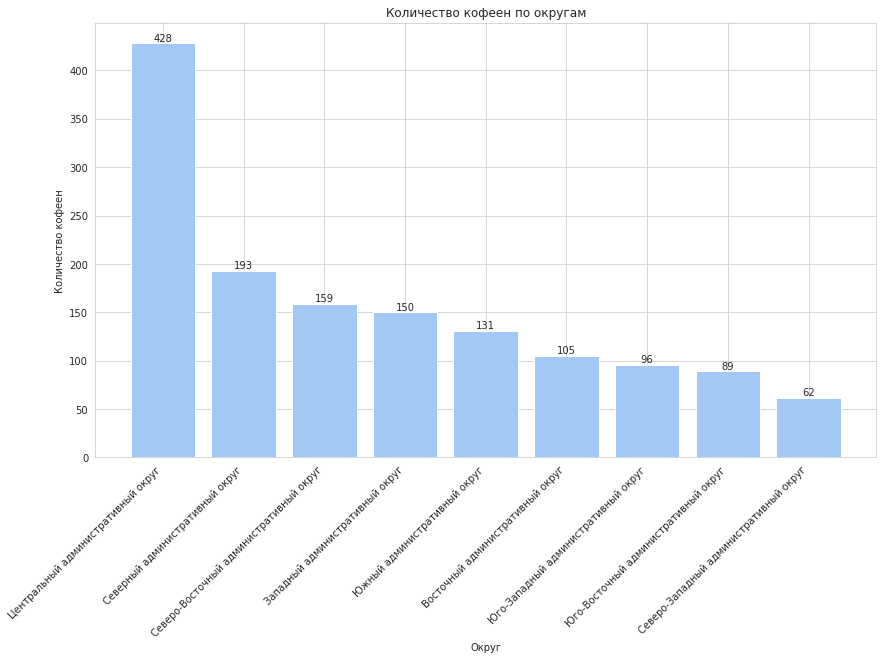

In [53]:
#создаем график
plt.figure(figsize=(14, 8)) 
plt.bar(coffee_house_district['district'], coffee_house_district['count']) 
plt.xlabel('Округ') 
plt.ylabel('Количество кофеен') 
plt.title('Количество кофеен по округам') 
plt.xticks(rotation=45, ha='right')

# добавляем числа на каждый столбец
for i, count in enumerate(coffee_house_district['count']):
    plt.annotate(str(count), xy=(i, count), ha='center', va='bottom')

plt.show() 

In [54]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, no_touch=True)
marker_cluster = MarkerCluster().add_to(m2)
moscow_lat, moscow_lng = 55.751244, 37.618423
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']}"
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffee_house.apply(create_marker, axis=1)

m2

In [55]:
#отмечаем центр города
moscow_lat, moscow_lng = 55.751244, 37.618423
#вставляем карту
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# делаем хороплет
Choropleth(
    geo_data=state_geo,
    data=coffee_house_district,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m5)

# выводим карту
m5

**Промежуточный итог:**  
В городе 1413 кофейни, 428 находятся в Центральном округе. По карте большинство кофеен распологается в местах с высокой проходимостью, прогулочных и оживленных улицах Москвы.

#### Круглосуточные кофейни

In [56]:
#узнаем круглосуточные кофейни
coffee_house_247 = coffee_house[coffee_house['is_24/7'] == True]
coffee_house_247['name'].count()

59

In [57]:
#взглянем на эти кофейни
coffee_house_247.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,Wild Bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,дмитровское шоссе,True
971,Wild Bean Cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,ярославское шоссе,True
1047,Wild Bean Cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,ярославское шоссе,True
1214,Wild Bean Cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,True
1291,Шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,True


In [58]:
#кажеться все круглосуточные кофейни относятся к сетям, проверим
coffee_house_247_chain = coffee_house_247.query('chain == 1')
coffee_house_247_chain['name'].count()

50

In [59]:
#узнаем долю круглосуточных кофеен
coffee_house_247['name'].count()/coffee_house_count

0.04175513092710545

In [60]:
disctrict_247_coffee = (
    coffee_house_247.pivot_table(
    index='district',
    values='name',
    aggfunc='count')
    .sort_values(by='name', ascending=False)
    .rename(columns={'name':'count'})
    .reset_index()
)
disctrict_247_coffee

,district,count
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [61]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, no_touch=True)
marker_cluster = MarkerCluster().add_to(m3)
moscow_lat, moscow_lng = 55.751244, 37.618423
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']}"
    ).add_to(marker_cluster)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffee_house_247 .apply(create_marker, axis=1)

m3

**Промежуточный итог:**  
Круглосуточных кофеен по городу очень мало, всего лишь 59. 26 из которых расположены в Центральном округе, когда как в Южном и Юго-Восточном округе их только по 1 штуке. Да и в центре, судя по карте, круглосуточные кофейни расположены не равномерно. С другой стороны вряд ли много людей пьют кофе ночью. 

#### Рейтинги кофеен и их распределение по районам

In [62]:
disctict_coffee_raiting = coffee_house.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending = False)
disctict_coffee_raiting

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


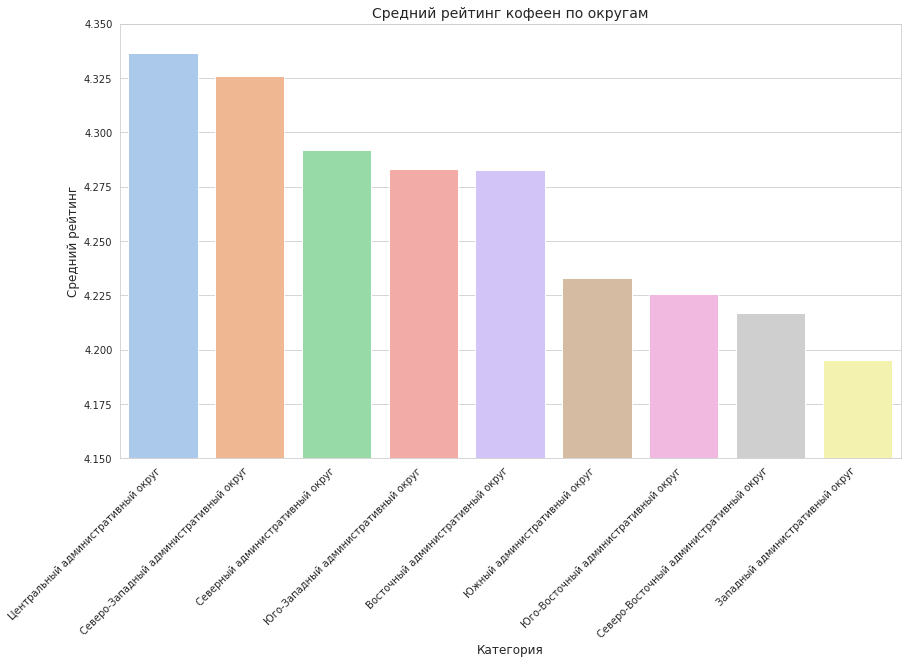

In [63]:
# Создаем график
sns.set_style('whitegrid')
sns.set_palette('pastel')
fig, ax = plt.subplots(figsize=(14, 8))
ax = sns.barplot(x='district', y='rating', data=disctict_coffee_raiting, palette='pastel', ci=None)
ax.set_xlabel('Категория', fontsize=12)
ax.set_ylabel('Средний рейтинг', fontsize=12)
ax.set_title('Средний рейтинг кофеен по округам', fontsize=14)
ax.set_ylim(4.15, 4.35)
plt.xticks(rotation=45, ha='right')
plt.show()

In [64]:
#отмечаем центр города
moscow_lat, moscow_lng = 55.751244, 37.618423
#вставляем карту
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# делаем хороплет
Choropleth(
    geo_data=state_geo,
    data=disctict_coffee_raiting,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Усредненный рейтинг заведений по районам',
).add_to(m4)

# выводим карту
m4

**Промежуточный итог:**  
Наилучший рейтинг кофеен в Центральном округе и составляет 4.33, самые низкие оценки получились в Западном округе с 4.19

#### Стоимость чашки капучино.

In [65]:
#выясним медианную цену чашечки кофе в разных округах.
kapuchino_district= coffee_house.pivot_table(index='district', values='middle_coffee_cup', aggfunc='median').reset_index().sort_values(by='middle_coffee_cup', ascending=False)
kapuchino_district

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


/opt/conda/lib/python3.9/site-packages/pandas/core/indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


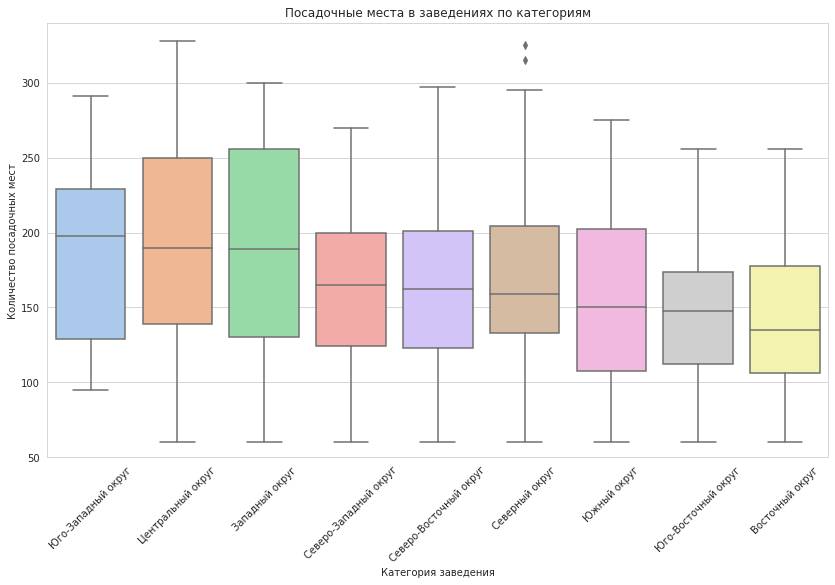

In [66]:
# удаляем лишнее длинное слово
coffee_house.loc[:, 'district'] = coffee_house['district'].str.replace('административный ', '').copy()
# строим график
plt.figure(figsize=(14,8))
sns.boxplot(x='district', y='middle_coffee_cup', data=coffee_house, order=coffee_house.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False).index) 
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.title('Посадочные места в заведениях по категориям')
plt.ylim([50,340])
plt.xticks(rotation=45)
plt.show()

In [67]:
#отмечаем центр города
moscow_lat, moscow_lng = 55.751244, 37.618423
#вставляем карту
m8 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# делаем хороплет
Choropleth(
    geo_data=state_geo,
    data=kapuchino_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Цены ча чашку капучино',
).add_to(m8)

# выводим карту
m8

In [68]:
from folium.plugins.heat_map import HeatMap
m9 = folium.Map([55.751244, 37.618423], zoom_start=10)
heatmap_data = coffee_house[['lat','lng', 'middle_coffee_cup']].copy().dropna()
heatmap = heatmap_data[['lat','lng', 'middle_coffee_cup']] 
HeatMap(data=heatmap, radius=14).add_to(m9)
m9 

**Промежуточный итог:**  
Самая высокая медианная цена за чашку кофе наблюдается в Юго-Западном округе и составляет 198 рублей. Самое дешевое медианное кофе в Восточном округе и его цена составляет 135. При этом ящик с усами нам показывает что наибольший разброс цен наблюдается в Центральном и Западных районах. А минимальный разброс цен так же в Восточном и Юго-Восточном округах.  
* Т.е. при открытии кофейни необходимо ориентироваться от местоположения кофейни т.к. условия в каждом округе города различны. 

#### Выводы и рекомендации к открытию кофейни


* Всего кофеен в городе насчитываеться 1413, наибольшее их количество,а именно 428, расположены в Центральном округе. Большинство кофеен распологается в местах с высокой проходимостью, в прогулочных и оживленных улицах Москвы.  
* Круглосуточных кофеен по городу очень мало, всего лишь 59. 26 из которых расположены в Центральном округе, когда как в Южном и Юго-Восточном округе их только по 1 штуке. Да и в центре, судя по карте, круглосуточные кофейни расположены не равномерно. С другой стороны вряд ли много людей пьют кофе ночью.
* Наилучший рейтинг кофеен в Центральном округе и составляет 4.33, самые низкие оценки получились в Западном округе с 4.19
* Самая высокая медианная цена за чашку кофе наблюдается в Юго-Западном округе и составляет 198 рублей. Самое дешевое медианное кофе в Восточном округе и его цена составляет 135. При этом наибольший разброс цен наблюдается в Центральном и Западных районах. А минимальный разброс цен так же в Восточном и Юго-Восточном округах.

**Рекомендации:**  
Исходя из проведенного анализа, можно порекомендовать к рассмотрению *Центральный, Западный и Юго-Западный округ* как место возможного открытия кофейни т.к.  

Центральный округ:  
* Относительно высокая цена за чашечку капучино - 190 рублей
* Наибольшее количество заведений, в том числе кофеен, может говорить о высокой проходимости и популярности заведений в округе.

Западаный округ:
* Относительно высокая цена за чашечку капучино - 189 рублей
* В среднем в Западном округе самые низкие рейтинги - 4.19.
* Относительно невысокая конкуренция - 150 кофеен в округе


Юго-Западный округ:
* Самая высокая медианная цена в городе, за чашечку капучино - 198 рублей
* Относительно высокая стартовая цена за чашку кофе по округам.
* Низкая конкуренция - 96 кофеен. 

**Презентация**: https://disk.yandex.ru/i/VP_am0DQbf2GZg

### Выводы


Нами во время работы над проектом были выполнены следующие шаги:
* Загружены все необходимые для дальнейшей работы библиотеки, а так же изучена общая информация датафрейма, в котором насчитывалось 8406 строк.
* Была проведена предобработка данных,во время которой найдены и удалены неявные дубликаты. Пропущенные значения были изучены,  но во избежание искажения данных оставлены в большая часть оставлена в первоночальном виде. А в отношении столбца price была проведена работа в части заполнения у сетевых заведений, т.к. у них одинаковые цены и они относятся к одному сегменту. Также были добавлены 2 новых столбца street и is_24/7 указывающие на улицу и круглосуточную ежедневную работу заведения.
* Во время анализа данных мы увидели что три самые крупные категории заведений это Кафе 28.3%(2377), Рестораны 24.3%(2043) и Кофейни 16.8%(1413). Самая маленькая категория оказалась булочная, насчитывая 256 заведений и занимая 3%. Так же по этим данным были построены визуализации в виде столбчатой и круговой диаграммы.
* Изучены данные по посадочным местам, и выяснено что медианное наибольшее число имеют рестораны(86), а минимальное булочные (50), при визуализации мы так же заметили что разброс данных не столь огромен и многие заведения соразмерны.
* Мы выияснили что 5200 заведений, что составляет 61,9%, не являются частью сети, а 3205 заведений , 38.1% соответственно, являются частью сетей.
* Тройкой лидеров категорий у сетевых заведений всё так же оказались Кафе(779), Рестораны(730), Кофейни(720). Но при этом большинство  сетевые заведения занимают в категориях, Кофейнях, Пиццериях (330) и Булочных(157)
* Самыми распространенными сетями в Москве оказались кофейня Шоколадница (119), Пиццерии Доминос (76) и ДоДо(74)
* В топ 15 самых распространенных сетевых заведений вошли 6 кофеен, 3 ресторана, 3 кафе, 2 пиццерии, 1 булочная
* Самое большое количество заведений расположенов в Центральном округе (2242), наименьшее Северо-Западном округе 409
* Наилучшие средние оценки у баров/пабов 4.38, наименьший рейтинг у быстрого питания 4.05
* Наилучшие средние оценки в Центральном округе 4.3, наименьшие рейтинги в Юго-Восточном округе 4.1
* Заведения расположены на карте неравномерно, а скорее ближе к самым проходимым местам.
* Улицами где оказалось больше всего заведений оказались проспект Мира(184), улица Профсоюзная (122), проспект Вернадского (108)
* Улиц в которых находится только одно заведение оказалось 456 и большниство из них оказались кафе в Центральном районе.
* Самые дорогие медианные чеки оказались в Западном и Центральном округах и составили 1000 рублей, а самые дешевые Юго-Восточный округ 450
Проведен анализ данных для открытия кофейни
* Выяснено что в городе имеется 1413 кофеен
* Из которых наибольшее количество (428) находится в Центральном округе, а наименьшее в Северо-Западном округе
* В городе 59 круглосуточных кофеен, что составляет только 4% от общего числа кофеен. Лидеров снова являеться Центральный округ с 26 такими кофейнями, а Юго-Восточный и Южный округа имеют только по 1 такой кофейне.
* Выяснены рейтинги кофеен по округам, наилучшие кофейни находятся в Центральном округе (4.3), а кофейни с наименьшим средним рейтингом в Задапном округе(4.1), хотя разница вроде как не сильно ощутима. Из чего можно предположить, что в среднем кофе в Москве везде одинаково хорош. 
* Выяснено что самые дорогая чашечка капучино подается в Юго-Западном округе, а самое дешевое в Восточном округе.